In [284]:
import pandas as pd
import numpy as np
import seaborn
import matplotlib.pyplot as plt
import plotly.express as px

# Analisis de los datos

### Abrir el dataframe y hacer un primer analisis de los datos que tenemos

In [285]:
df = pd.read_csv("dubai_properties.csv")
df

,Address,Rent,Beds,Baths,Type,Area_in_sqft,Rent_per_sqft,Rent_category,Frequency,Furnishing,Purpose,Posted_date,Age_of_listing_in_days,Location,City,Latitude,Longitude
0,"The Gate Tower 2, The Gate Tower, Shams Gate D...",124000,3,4,Apartment,1785,69.467787,Medium,Yearly,Unfurnished,For Rent,2024-03-07,45,Al Reem Island,Abu Dhabi,24.493598,54.407841
1,"Water's Edge, Yas Island, Abu Dhabi",140000,3,4,Apartment,1422,98.452883,Medium,Yearly,Unfurnished,For Rent,2024-03-08,44,Yas Island,Abu Dhabi,24.494022,54.607372
2,"Al Raha Lofts, Al Raha Beach, Abu Dhabi",99000,2,3,Apartment,1314,75.342466,Medium,Yearly,Furnished,For Rent,2024-03-21,31,Al Raha Beach,Abu Dhabi,24.485931,54.600939
3,"Marina Heights, Marina Square, Al Reem Island,...",220000,3,4,Penthouse,3843,57.246942,High,Yearly,Unfurnished,For Rent,2024-02-24,57,Al Reem Island,Abu Dhabi,24.493598,54.407841
4,"West Yas, Yas Island, Abu Dhabi",350000,5,7,Villa,6860,51.020408,High,Yearly,Unfurnished,For Rent,2024-02-16,65,Yas Island,Abu Dhabi,24.494022,54.607372
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73737,"Al Huboob 1, Al Salamah, Umm Al Quwain",14000,0,1,Apartment,419,33.412888,Low,Yearly,Unfurnished,For Rent,2023-12-14,129,Al Salamah,Umm Al Quwain,25.493412,55.575994
73738,"Umm Al Quwain Marina, Umm Al Quwain",14000,0,1,Apartment,500,28.000000,Low,Yearly,Unfurnished,For Rent,2023-12-14,129,Umm Al Quwain Marina,Umm Al Quwain,25.527959,55.606527
73739,"King Faisal Street, Umm Al Quwain",50000,3,4,Apartment,2000,25.000000,Low,Yearly,Unfurnished,For Rent,2024-01-02,110,King Faisal Street,Umm Al Quwain,NaN,NaN
73740,"Al Maqtaa, Umm Al Quwain",37000,1,2,Apartment,989,37.411527,Low,Yearly,Unfurnished,For Rent,2023-10-23,181,Al Maqtaa,Umm Al Quwain,NaN,NaN


# Limpieza de datos

 Como podemos observar, tenemos datos nulos, los cuales no nos interesan para el entrenamiento del modelo, por lo tanto los borraremos

In [286]:
df.dropna(inplace=True)
df = df.reset_index()
df = df.drop("index",axis=1)

# Graficas

### Mapa con la ubicacion de las propiedades en alquiler

In [287]:
fig = px.scatter_mapbox(df, lat="Latitude", lon="Longitude", hover_name="Address", hover_data=["Rent", "Beds", "Baths","Area_in_sqft","Posted_date"],
                        color_discrete_sequence=["fuchsia"], zoom=5, height=600)

     
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(title='Properties Locations')

 
fig.show()

### Cantidad de alquileres por pais

En esta grafica podremos ver los países en los que el alquiler tiene más relevancia

In [288]:
city_distribution = df['City'].value_counts().reset_index()
city_distribution.columns = ['City', 'Number_Properties']
city_distribution

fig = px.bar(city_distribution, x="City", y="Number_Properties", title="Number of Properties by City")
fig.show()

### Media de precio de alquiler por pais

In [289]:
city_rent_mean = df.groupby("City")["Rent"].mean().reset_index()
city_rent_mean.columns = ['City', 'Rent_mean']
city_rent_mean

fig = px.bar(city_rent_mean, x="City", y="Rent_mean", title="Mean of rent by City")
fig.show()

### Cantidad de alquileres amueblados y sin amueblar por pais

In [290]:
city_rent_mean = df[["City","Furnishing"]].groupby("City").value_counts().reset_index()
city_rent_mean.columns = ['City', 'Furnishing',"Count"]
city_rent_mean

fig = px.histogram(city_rent_mean, x="City", y="Count",
             color='Furnishing', barmode='group',
             histfunc='avg',
             height=400)
fig.show()

### Cantidad de tipo de alquileres por pais

In [291]:
# city_rent_mean = df[["City","Type"]].groupby("City").value_counts().reset_index()
# city_rent_mean.columns = ['City', 'Type',"Count"]
# city_rent_mean

# fig = px.histogram(city_rent_mean, x="City", y="Count",
#              color='Type', barmode='group',
#              histfunc='avg',
#              height=400)
# fig.show()

In [292]:
from dash import Dash, dcc, html, Input, Output
import plotly.express as px

city_rent_mean = df[["City","Type"]].groupby("City").value_counts().reset_index()
city_rent_mean.columns = ['City', 'Type',"Count"]

app = Dash(__name__)


app.layout = html.Div([
    html.H4('Type of renting by City'),
    dcc.Dropdown(
        id="dropdown",
        options=city_rent_mean["City"].unique(),
        value="Fri",
        clearable=False,
    ),
    dcc.Graph(id="graph"),
])


@app.callback(
    Output("graph", "figure"), 
    Input("dropdown", "value"))
def update_bar_chart(city):
    # df = px.data.tips() # replace with your own data source
    mask = city_rent_mean["City"] == city
    fig = px.bar(city_rent_mean[mask], x="Type", y="Count", 
                 color="Type", barmode="group")
    return fig


app.run_server(debug=True)

# Haciendo doble click en el lado de la derecha de la grafica, donde pone "Type" en el icono de cada tipo, mostrará solo el seleccionado

### Cantidad de alquileres según la categoría

In [293]:
category_type = df[["Rent_category","Type"]].groupby("Type").value_counts().reset_index()
category_type.columns = ['Rent_category', 'Type',"Count"]


fig = px.pie(category_type, values='Count', names='Rent_category', title='Population of European continent')
fig.show()

### Cantidad de alquileres segun el tipo y la categoria

In [294]:
fig = px.bar(category_type, x="Rent_category", y="Count", color="Type", title="Long-Form Input")
fig.show()

### Precios por mes a lo largo del tiempo

In [295]:
prices_month_mean = df[["Posted_date", "Rent"]].groupby("Posted_date")["Rent"].mean().reset_index()
prices_month_mean

fig = px.line(prices_month_mean, x='Posted_date', y="Rent", title="Price over time (group by date)")
fig.show()

### Mapa de calor

Text(0.5, 1.0, 'Correlation Matrix')

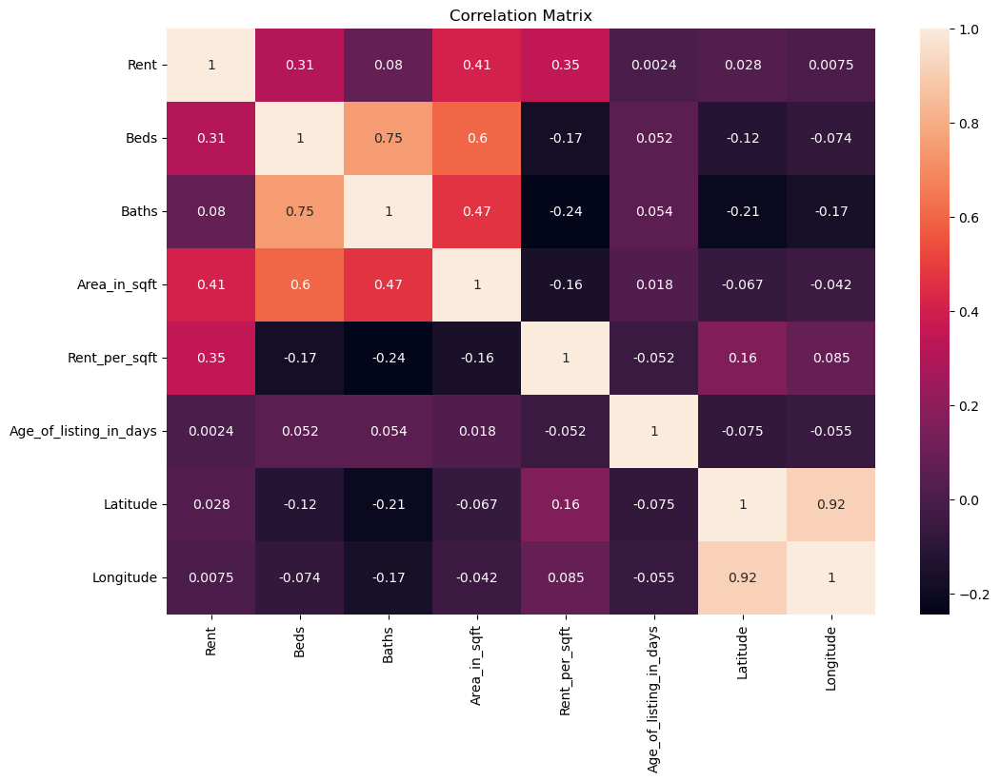

In [296]:
heatmap_columns = ["Rent", "Beds", "Baths", "Area_in_sqft", "Rent_per_sqft", "Age_of_listing_in_days", "Latitude", "Longitude"]
df_heatmap = df[heatmap_columns]
matrix_corr = df_heatmap.corr()

plt.figure(figsize=(12, 8))
seaborn.heatmap(data=matrix_corr, annot=True)
plt.title("Correlation Matrix")

# Preaparación de los datos y creacion del modelo

### Pasar la fecha a un valor float

In [297]:
# df['Posted_date'] = pd.to_datetime(df['Posted_date'])
# fecha_referencia = df['Posted_date'].min()
# df['Posted_date_float'] = (df['Posted_date'] - fecha_referencia).dt.total_seconds().astype(float)
# df

# df['Posted_date'] = pd.to_datetime(df['Posted_date'])    
# df['Posted_date_delta'] = (df['Posted_date'] - df['Posted_date'].min())  / np.timedelta64(1,'D')
# city_data = df[df['city'] == 'London']
# result = sm.ols(formula = 'sales ~ date_delta', data = city_data).fit()
# df

In [298]:
# Supongamos que tienes un DataFrame df con una columna 'fecha' de tipo datetime
# Convertir la columna de fecha a tipo datetime (si aún no lo está)
# df['Posted_date'] = pd.to_datetime(df['Posted_date'])

# # Extraer componentes de fecha útiles
# df['year'] = df['Posted_date'].dt.year
# df['month'] = df['Posted_date'].dt.month
# df['day_of_week'] = df['Posted_date'].dt.dayofweek  # 0: Lunes, 1: Martes, ..., 6: Domingo
# df['day_of_month'] = df['Posted_date'].dt.day
# df['is_weekend'] = df['Posted_date'].dt.dayofweek // 5  # Marcar si es fin de semana (0: No, 1: Sí)

In [299]:
df

,Address,Rent,Beds,Baths,Type,Area_in_sqft,Rent_per_sqft,Rent_category,Frequency,Furnishing,Purpose,Posted_date,Age_of_listing_in_days,Location,City,Latitude,Longitude
0,"The Gate Tower 2, The Gate Tower, Shams Gate D...",124000,3,4,Apartment,1785,69.467787,Medium,Yearly,Unfurnished,For Rent,2024-03-07,45,Al Reem Island,Abu Dhabi,24.493598,54.407841
1,"Water's Edge, Yas Island, Abu Dhabi",140000,3,4,Apartment,1422,98.452883,Medium,Yearly,Unfurnished,For Rent,2024-03-08,44,Yas Island,Abu Dhabi,24.494022,54.607372
2,"Al Raha Lofts, Al Raha Beach, Abu Dhabi",99000,2,3,Apartment,1314,75.342466,Medium,Yearly,Furnished,For Rent,2024-03-21,31,Al Raha Beach,Abu Dhabi,24.485931,54.600939
3,"Marina Heights, Marina Square, Al Reem Island,...",220000,3,4,Penthouse,3843,57.246942,High,Yearly,Unfurnished,For Rent,2024-02-24,57,Al Reem Island,Abu Dhabi,24.493598,54.407841
4,"West Yas, Yas Island, Abu Dhabi",350000,5,7,Villa,6860,51.020408,High,Yearly,Unfurnished,For Rent,2024-02-16,65,Yas Island,Abu Dhabi,24.494022,54.607372
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73018,"Al Salamah, Umm Al Quwain",10000,0,1,Apartment,249,40.160643,Low,Yearly,Unfurnished,For Rent,2023-12-09,134,Al Salamah,Umm Al Quwain,25.493412,55.575994
73019,"Al Ramlah, Umm Al Quwain",25000,1,1,Villa,500,50.000000,Low,Yearly,Unfurnished,For Rent,2023-12-01,142,Al Ramlah,Umm Al Quwain,25.511461,55.578804
73020,"Umm Al Quwain Marina, Umm Al Quwain",22000,2,2,Apartment,1000,22.000000,Low,Yearly,Unfurnished,For Rent,2024-03-26,26,Umm Al Quwain Marina,Umm Al Quwain,25.527959,55.606527
73021,"Al Huboob 1, Al Salamah, Umm Al Quwain",14000,0,1,Apartment,419,33.412888,Low,Yearly,Unfurnished,For Rent,2023-12-14,129,Al Salamah,Umm Al Quwain,25.493412,55.575994


### Label encoder

In [300]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, MinMaxScaler

# Obtener una lista con el nombre de las columnas que queremos normalizar
col_to_normalize_le = ["Rent_category", "Furnishing"] 
col_to_normalize_ohe = ["Type", "Purpose", "City", "Location"] 

# Hacemos una copia del dataset
df_normalize = df.drop(["Frequency", "Posted_date", "Address"], axis=1).copy()

# Inicializar el LabelEncoder
le = LabelEncoder()

# Pasar por cada columna y realizar la transformacion
for col in col_to_normalize_le:
    le.fit(df_normalize[col])
    df_normalize[col] = np.int64(le.transform(df_normalize[col]))

# Inicializamos el OneHotEncoder
ohe = OneHotEncoder(sparse_output=False)
data_concat = df_normalize.copy()

# Aplicamos ohe a cada columna que nos interese
for col in col_to_normalize_ohe:
    encoded_col = le.fit_transform(df_normalize[col]).reshape(-1, 1)
    one_hot_array = ohe.fit_transform(encoded_col)
    new_columns = ohe.get_feature_names_out([col])
    onehot_encoded_df = pd.DataFrame(one_hot_array, columns=new_columns)
    data_concat = pd.concat([data_concat, onehot_encoded_df], axis=1)
    data_concat = data_concat.drop(col,axis=1)

# Escalar las columnas necesarias
columnas_a_escalas = data_concat.columns[data_concat.columns != "Rent"]

# Declaramos el MinMaxScaler 
scaler = MinMaxScaler()

# Aplicamos el scaler a todas las columnas menos el Rent, ya que este es el valor que queremos predecir
df_scaled = data_concat.copy()
df_scaled[columnas_a_escalas] = scaler.fit_transform(df_scaled[columnas_a_escalas])

df_scaled

,Rent,Beds,Baths,Area_in_sqft,Rent_per_sqft,Rent_category,Furnishing,Age_of_listing_in_days,Latitude,Longitude,...,Location_349,Location_350,Location_351,Location_352,Location_353,Location_354,Location_355,Location_356,Location_357,Location_358
0,124000,0.250000,0.3,0.008141,0.031836,1.0,1.0,0.015011,0.867214,0.849843,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,140000,0.250000,0.3,0.006414,0.045120,1.0,1.0,0.014570,0.867254,0.865180,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,99000,0.166667,0.2,0.005900,0.034528,1.0,0.0,0.008830,0.866501,0.864686,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,220000,0.250000,0.3,0.017932,0.026235,0.0,1.0,0.020309,0.867214,0.849843,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,350000,0.416667,0.6,0.032287,0.023382,0.0,1.0,0.023841,0.867254,0.865180,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73018,10000,0.000000,0.0,0.000833,0.018405,0.5,1.0,0.054305,0.960268,0.939636,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
73019,25000,0.083333,0.0,0.002027,0.022914,0.5,1.0,0.057837,0.961948,0.939852,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
73020,22000,0.166667,0.1,0.004406,0.010082,0.5,1.0,0.006623,0.963483,0.941983,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
73021,14000,0.000000,0.0,0.001641,0.015313,0.5,1.0,0.052097,0.960268,0.939636,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [301]:
from sklearn.model_selection import train_test_split
import random

# Dividimos las datos entre train y test
y = df_scaled["Rent"].copy()
x = df_scaled.drop(["Rent"],axis=1)

X_train_full, X_test, y_train_full, y_test = train_test_split(x, y, test_size=0.2, random_state=random.seed(42))

# Dividmos los datos de train para obtener datos de validacion
limit = round(X_train_full.shape[0] * 0.2)
X_val, X_train = X_train_full[:limit], X_train_full[limit:]
y_val, y_train = y_train_full[:limit], y_train_full[limit:]

In [302]:
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam

imput_dimension = X_train.shape[1]

model = Sequential()
model.add(Dense(1000 , input_dim=imput_dimension, activation="relu"))
model.add(Dense(300, activation="relu"))
model.add(Dense(200, activation="relu"))
model.add(keras.layers.Dropout(0.2))
model.add(Dense(50, activation="relu"))
model.add(Dense(10, activation="relu"))
model.add(Dense(1))


model.compile(loss="mean_squared_error", optimizer="adam", metrics=["mae"])

model.summary()

Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_144 (Dense)           (None, 1000)              387000    
                                                                 
 dense_145 (Dense)           (None, 300)               300300    
                                                                 
 dense_146 (Dense)           (None, 200)               60200     
                                                                 
 dropout_17 (Dropout)        (None, 200)               0         
                                                                 
 dense_147 (Dense)           (None, 50)                10050     
                                                                 
 dense_148 (Dense)           (None, 10)                510       
                                                                 
 dense_149 (Dense)           (None, 1)               

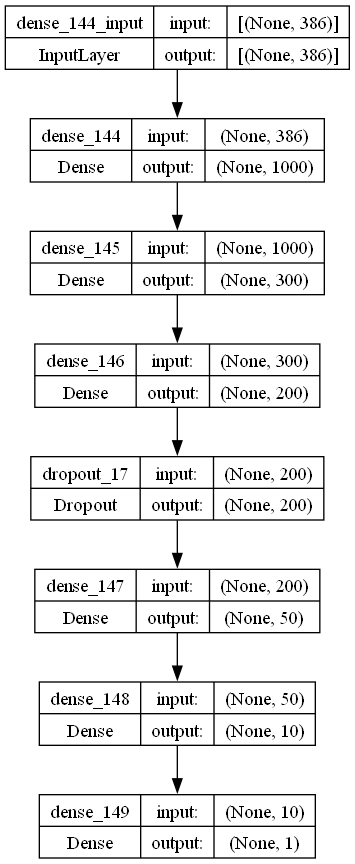

In [303]:
keras.utils.plot_model(
    model,
    show_shapes=True
)

In [304]:
random.seed(42)

epochs = 100

early_stopping_cb = keras.callbacks.EarlyStopping(patience=10,restore_best_weights=True)

history = model.fit(X_train,y_train,epochs=epochs,validation_data=(X_val,y_val),callbacks=[early_stopping_cb])

Epoch 1/100
1461/1461 [==============================] - 14s 9ms/step - loss: 93048553472.0000 - mae: 56744.3203 - val_loss: 17231515648.0000 - val_mae: 41092.7344
Epoch 2/100
1461/1461 [==============================] - 13s 9ms/step - loss: 74974248960.0000 - mae: 36254.2773 - val_loss: 12333056000.0000 - val_mae: 32122.1777
Epoch 3/100
1461/1461 [==============================] - 14s 9ms/step - loss: 64955146240.0000 - mae: 32499.9180 - val_loss: 10608350208.0000 - val_mae: 28176.2109
Epoch 4/100
1461/1461 [==============================] - 12s 8ms/step - loss: 59237859328.0000 - mae: 31394.0742 - val_loss: 12224458752.0000 - val_mae: 29844.0039
Epoch 5/100
1461/1461 [==============================] - 12s 8ms/step - loss: 52306251776.0000 - mae: 31245.3555 - val_loss: 13266223104.0000 - val_mae: 26901.6875
Epoch 6/100
1461/1461 [==============================] - 13s 9ms/step - loss: 45211918336.0000 - mae: 29954.5176 - val_loss: 26175604736.0000 - val_mae: 31486.9707
Epoch 7/100
1461

### Pintamos la grafica de aprendizaje del modelo

<AxesSubplot:>

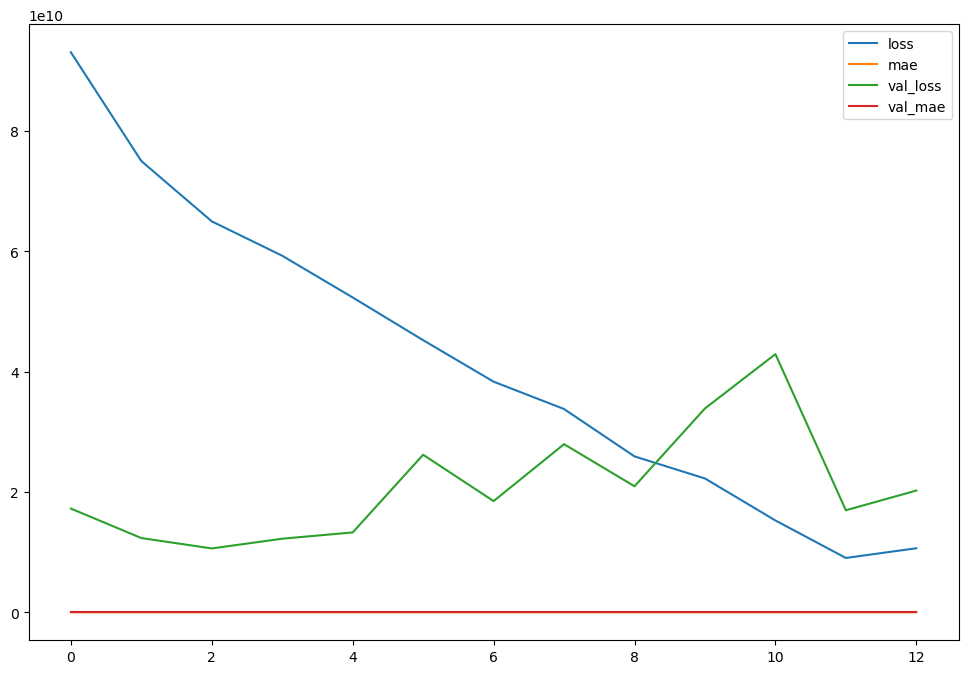

In [305]:
pd.DataFrame(history.history).plot(figsize=(12,8))

In [306]:
model.evaluate(X_test,y_test)

# [13703284736.0, 29563.580078125]


457/457 [==============================] - 1s 3ms/step - loss: 12863312896.0000 - mae: 29225.9219


[12863312896.0, 29225.921875]

In [307]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Utiliza el modelo para hacer predicciones en el conjunto de prueba
y_pred = model.predict(X_test)

# Calcula el error cuadrático medio (MSE)
mse = mean_squared_error(y_test, y_pred)
print("Error cuadrático medio (MSE):", mse)

# Calcula el error absoluto medio (MAE)
mae = mean_absolute_error(y_test, y_pred)
print("Error absoluto medio (MAE):", mae)

# Calcula el coeficiente de determinación (R²)
r2 = r2_score(y_test, y_pred)
print("Coeficiente de determinación (R²):", r2)

# Con este modelo he llegado a conseguir los siguientes resultados:

# Error cuadrático medio (MSE): 9275010534.025024
# Error absoluto medio (MAE): 27056.429792485927
# Coeficiente de determinación (R²): 0.8186885780199793

457/457 [==============================] - 1s 2ms/step
Error cuadrático medio (MSE): 12863309337.339186
Error absoluto medio (MAE): 29225.935936864782
Coeficiente de determinación (R²): 0.7503033163447762
